<a href="https://colab.research.google.com/github/Quantum00000/Machine_Learning_And_AI/blob/main/Logistic_Regression_with_Scikit_Learn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np

In [2]:
df=pd.read_csv("weatherAUS.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [4]:
df.dropna(subset=['RainToday','RainTomorrow'],inplace=True)

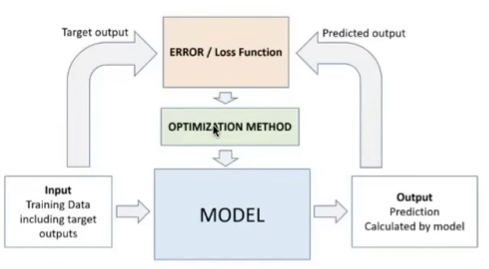

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null   fl

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [7]:
px.histogram(df,x='Location',title="Location Vs Rainy day", color='RainToday')

In [8]:
px.histogram(df,x='Temp3pm',title='Temprature at 3pm vs Rain Tommorow',color="RainTomorrow")

In [9]:
px.histogram(df,x='Humidity3pm', title='Humidity at 9am vs Rain Tomorrow', color="RainTomorrow")

In [10]:
train,valid,test=np.split(df.sample(frac=1),[int(0.6*len(df)),int(0.8*len(df))])

/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:57: FutureWarning:

'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.



In [11]:
print('train:',train.shape)
print('valid:',valid.shape)
print('test:',test.shape)

train: (84472, 23)
valid: (28157, 23)
test: (28158, 23)


We have divide the data randomly into train , test ,valid datasets, But  If we divide the data year wise , It can make prediction better as later on too , we have to predict data of future.

In [12]:
year=pd.to_datetime(df.Date).dt.year


In [13]:
df_train=df[year<2015]
df_valid=df[year==2015]
df_test=df[year>2015]

In [14]:
df_train

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,2014-12-27,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,...,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No,No
144549,2014-12-28,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,...,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No,No
144550,2014-12-29,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,...,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No,No
144551,2014-12-30,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,...,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No,No


In [15]:
print(pd.to_datetime(df_train.Date).dt.year.unique())
print(pd.to_datetime(df_valid.Date).dt.year.unique())
print(pd.to_datetime(df_test.Date).dt.year.unique())
print(df_train.shape)
print(df_valid.shape)
print(df_test.shape)



[2008 2009 2010 2011 2012 2013 2014 2007]
[2015]
[2016 2017]
(97988, 23)
(17089, 23)
(25710, 23)


Lets create input and target columns

In [16]:
input_col=list(df.columns)[1:-1]
target_col=df.columns[-1]

Creating train,val,test data sets with these input and target column

In [17]:
train_input=df_train[input_col].copy()
train_target=df_train[target_col].copy()

In [18]:
val_input=df_valid[input_col].copy()
val_target=df_valid[target_col].copy()

In [19]:
test_input=df_test[input_col].copy()
test_target=df_test[target_col].copy()

Now Moving Further, Lets differentiate numeric and categorical data

In [20]:
numeric_cols=train_input.select_dtypes(include=np.number).columns.tolist()
categorical_cols= train_input.select_dtypes('object').columns.tolist()

In [21]:
train_input[categorical_cols].nunique()

,0
Location,49
WindGustDir,16
WindDir9am,16
WindDir3pm,16
RainToday,2


Now as we can see our data have so many NaN values , and in ml dataset there should not be any empty value,

So we will use Simple Imputer lib,

we can have several strategy like mean,median etc

In [22]:
from sklearn.impute import SimpleImputer

In [23]:
imputer = SimpleImputer(strategy='mean')


In [24]:
df[numeric_cols].isna().sum()

,0
MinTemp,468
MaxTemp,307
Rainfall,0
Evaporation,59694
Sunshine,66805
WindGustSpeed,9105
WindSpeed9am,1055
WindSpeed3pm,2531
Humidity9am,1517
Humidity3pm,3501


This represent number of null values in each column

In [25]:
imputer.fit(df[numeric_cols])

SimpleImputer()

In [26]:
list(imputer.statistics_)

[np.float64(12.18482386562048),
 np.float64(23.235120301822324),
 np.float64(2.349974074310839),
 np.float64(5.472515506887154),
 np.float64(7.630539861047281),
 np.float64(39.97051988882308),
 np.float64(13.990496092519967),
 np.float64(18.631140782316862),
 np.float64(68.82683277087672),
 np.float64(51.44928834695453),
 np.float64(1017.6545771543717),
 np.float64(1015.2579625879797),
 np.float64(4.431160817585808),
 np.float64(4.499250233195188),
 np.float64(16.98706638787991),
 np.float64(21.69318269001107)]

Imputer just have calculated the mean , no field are updated yet, For that we should do Transform function.

In [27]:
imputer.transform(df[numeric_cols])

array([[13.4       , 22.9       ,  0.6       , ...,  4.49925023,
        16.9       , 21.8       ],
       [ 7.4       , 25.1       ,  0.        , ...,  4.49925023,
        17.2       , 24.3       ],
       [12.9       , 25.7       ,  0.        , ...,  2.        ,
        21.        , 23.2       ],
       ...,
       [ 3.6       , 25.3       ,  0.        , ...,  4.49925023,
        10.9       , 24.5       ],
       [ 5.4       , 26.9       ,  0.        , ...,  4.49925023,
        12.5       , 26.1       ],
       [ 7.8       , 27.        ,  0.        , ...,  2.        ,
        15.1       , 26.        ]])

Imputer stores data in array form, still no data is been changed, we have to put this transformation into the dataframe

In [28]:
train_input[numeric_cols]=imputer.transform(train_input[numeric_cols])

In [29]:
val_input[numeric_cols]=imputer.transform(val_input[numeric_cols])

In [30]:
test_input[numeric_cols]=imputer.transform(test_input[numeric_cols])

Now original numerical data is been rewrited,all thhe null value is been changed

In [31]:
train_input[numeric_cols].isna().sum()

,0
MinTemp,0
MaxTemp,0
Rainfall,0
Evaporation,0
Sunshine,0
WindGustSpeed,0
WindSpeed9am,0
WindSpeed3pm,0
Humidity9am,0
Humidity3pm,0


In [32]:
train_input[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,12.008398,23.022609,2.372935,5.357666,7.617805,40.198776,14.091355,18.763152,68.630871,51.469317,1017.526831,1015.144057,4.348731,4.443238,16.836016,21.541069
std,6.337005,6.977735,8.518819,3.136123,2.913498,13.212242,8.944051,8.823879,18.900823,20.637576,6.735769,6.663187,2.299375,2.142256,6.385810,6.810814
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,3.800000,7.500000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.400000,1010.900000,3.000000,3.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,5.472516,7.630540,39.000000,13.000000,19.000000,69.000000,52.000000,1017.654577,1015.257963,4.431161,4.499250,16.600000,21.000000
75%,16.600000,27.900000,0.800000,5.600000,9.200000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.300000,6.000000,6.000000,21.300000,26.100000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


Now the min and max values are too far apart from min and max , so how if all min values of all coluns are like near 0 and all max values are near 1, it will make easy computation for our model

In [33]:
from sklearn.preprocessing import MinMaxScaler

In [34]:
scaler=MinMaxScaler()

In [35]:
scaler.fit(df[numeric_cols])

MinMaxScaler()

In [36]:
train_input[numeric_cols]=scaler.transform(train_input[numeric_cols])

In [37]:
val_input[numeric_cols]=scaler.transform(val_input[numeric_cols])

In [38]:
test_input[numeric_cols]=scaler.transform(test_input[numeric_cols])

In [39]:
train_input.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.483689,0.525947,0.006396,0.036949,0.525366,0.265107,0.108395,0.215668,0.686309,0.514693,0.612014,0.608705,0.483192,0.493693,0.507089,0.517103
std,0.149458,0.131904,0.022962,0.021628,0.200931,0.102420,0.068800,0.101424,0.189008,0.206376,0.111335,0.106611,0.255486,0.238028,0.134722,0.130726
min,0.000000,0.013233,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030400,0.000000,0.000000,0.027426,0.005758
25%,0.377358,0.429112,0.000000,0.026207,0.517241,0.193798,0.053846,0.149425,0.570000,0.370000,0.543802,0.540800,0.333333,0.333333,0.409283,0.422265
50%,0.478774,0.514178,0.000000,0.037741,0.526244,0.255814,0.100000,0.218391,0.690000,0.520000,0.614125,0.610527,0.492351,0.499917,0.502110,0.506718
75%,0.591981,0.618147,0.002156,0.038621,0.634483,0.310078,0.146154,0.275862,0.830000,0.650000,0.682645,0.675200,0.666667,0.666667,0.601266,0.604607
max,1.000000,1.000000,1.000000,0.568276,0.986207,1.000000,0.669231,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.988484


Now all min and max values are almost near 0 and 1, and if u take a look on our data , now data is in the range of 0 and 1 too, easy to compute with

# One-Hot Encoding

In [40]:
from sklearn.preprocessing import OneHotEncoder

In [41]:
encoder=OneHotEncoder(sparse_output=False,handle_unknown='ignore')

In [42]:
raw_df2=df[categorical_cols].fillna('Unknown')

In [43]:
encoder.fit(raw_df2)

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [44]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'Unknown', 'W', 'WNW', 'WSW'], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'Unknown', 'W', 'WNW', 'WSW'], dtype=

In [45]:
encoded_cols=list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

In [46]:
train_input[encoded_cols]=encoder.transform(train_input[categorical_cols].fillna('unknown'))
val_input[encoded_cols]=encoder.transform(val_input[categorical_cols].fillna('unknown'))
test_input[encoded_cols]=encoder.transform(test_input[categorical_cols].fillna('unknown'))

/tmp/ipython-input-3780049724.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipython-input-3780049724.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipython-input-3780049724.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipython-input-3780049724.py:1: PerformanceWarning:

In [47]:
test_input

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_Unknown,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes
2498,Albury,0.681604,0.801512,0.000000,0.037741,0.526244,ENE,0.372093,NaN,ESE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2499,Albury,0.693396,0.725898,0.001078,0.037741,0.526244,SSE,0.341085,SSE,SE,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2500,Albury,0.634434,0.527410,0.005930,0.037741,0.526244,ENE,0.325581,ESE,ENE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2501,Albury,0.608491,0.538752,0.042049,0.037741,0.526244,SSE,0.255814,SE,SSE,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2502,Albury,0.566038,0.523629,0.018329,0.037741,0.526244,ENE,0.193798,SE,SSE,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,Uluru,0.283019,0.502836,0.000000,0.037741,0.526244,E,0.193798,ESE,E,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145455,Uluru,0.266509,0.533081,0.000000,0.037741,0.526244,E,0.193798,SE,ENE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145456,Uluru,0.285377,0.568998,0.000000,0.037741,0.526244,NNW,0.124031,SE,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145457,Uluru,0.327830,0.599244,0.000000,0.037741,0.526244,N,0.240310,SE,WNW,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


Now we have done some preprocessing and have bit large dataset which is being preprocessed already, next time when we will open the notebook, these preprocessing will happen again , this is not good with larger dataset project , so we save the preprocessed data using parquet.

# Now most of the preprocessing is being done

# LogisticRegression training

In [48]:
from sklearn.linear_model import LogisticRegression

In [49]:
model = LogisticRegression(solver='liblinear')

In [50]:
model.fit(train_input[numeric_cols+encoded_cols],train_target)

LogisticRegression(solver='liblinear')

In [51]:
train_target

,RainTomorrow
0,No
1,No
2,No
3,No
4,No
...,...
144548,No
144549,No
144550,No
144551,No


Train_target can be categorical but train_input can't be categorical , because logistic Regression converts targets into 0 and 1 but not inputs

In [52]:
print(numeric_cols + encoded_cols)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_

In [53]:
print(model.coef_.tolist())

[[0.8944639716350439, -2.883748085890151, 3.1670803365753106, 0.8754917400775044, -1.6711920941569147, 6.767482782335979, -0.9347354499501354, -1.4308208491173613, 0.3216881231406752, 5.99822035446041, 5.479703566243257, -9.193283924382083, -0.1616404213688518, 1.2877811325545916, 0.4743977702245304, 2.0304052517021156, 0.6006210797242614, -0.5482725581277696, 0.47585100644793255, 0.005500995769444547, 0.34481933416300026, -0.3541807524015025, 0.17795286961162662, 0.43973144704469824, -0.015398009849747743, 0.0275463259890632, 0.25686392637299127, -0.021912826362947363, -0.04482337469072583, -0.4845748086877685, -0.1389748069971942, -0.5769820872039546, -0.7888200268529328, -0.2577195794568141, -0.3301486912443618, -0.5704164786588043, 0.08005905574452264, 0.010464095226803694, 0.0630799389168588, -0.9041757914381535, -0.4426300030058684, 0.0038061620440262268, -0.46231625696898837, -0.46668028289077473, -0.07067744591411404, 0.18986620929425674, 0.44869053146277565, 0.6068560417084923

In [54]:
print(model.intercept_)

[-2.51738156]


In [55]:
pred=model.predict(test_input[numeric_cols+encoded_cols])

In [56]:
pred

array(['No', 'No', 'Yes', ..., 'No', 'No', 'No'], dtype=object)

In [57]:
test_target

,RainTomorrow
2498,No
2499,Yes
2500,Yes
2501,Yes
2502,No
...,...
145454,No
145455,No
145456,No
145457,No


In [58]:
from sklearn.metrics import accuracy_score

In [59]:
accuracy_score(test_target,pred)

0.842045896538312

If we want to find the probability of predictions

In [60]:
train_prob=model.predict_proba(test_input[numeric_cols+encoded_cols])

In [61]:
train_prob

array([[0.92727277, 0.07272723],
       [0.83079749, 0.16920251],
       [0.48031498, 0.51968502],
       ...,
       [0.99138618, 0.00861382],
       [0.97697234, 0.02302766],
       [0.98814411, 0.01185589]])

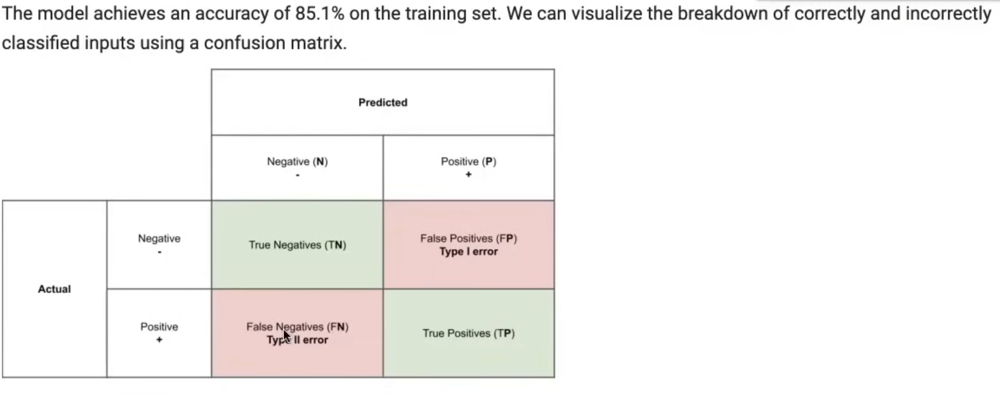

In [62]:
from sklearn.metrics import confusion_matrix

In [63]:
confusion_matrix(test_target,pred,normalize='true')

array([[0.94739754, 0.05260246],
       [0.51759657, 0.48240343]])

Accuracy is good but the confusion matrix says something else , according to confusion matrix model prediction is half true and half false type,Like kind of half half situation

# **Learn how to save preprocessing data which he earlier taught and then saving trained model and its data at 4:30:00**

Helper function to predit for individual values

In [64]:
def predict_input(single_input):
  input_df=pd.DataFrame([single_input])

  # Impute and scale numeric columns
  input_df[numeric_cols]=imputer.transform(input_df[numeric_cols])
  input_df[numeric_cols]=scaler.transform(input_df[numeric_cols])

  # Transform categorical columns
  encoded_input_cat = encoder.transform(input_df[categorical_cols])
  encoded_input_df = pd.DataFrame(encoded_input_cat, columns=encoded_cols)

  # Combine numeric and encoded categorical columns
  # Drop the original categorical columns from input_df first
  input_df = input_df.drop(columns=categorical_cols)
  X_input = pd.concat([input_df[numeric_cols], encoded_input_df], axis=1)

  prediction=model.predict(X_input)[0]
  prob=model.predict_proba(X_input)[0][list(model.classes_).index(prediction)] # Use 'prediction' instead of 'pred' (which was undefined)
  return prediction,prob

In [65]:
new_input={'Date': '2008-12-01', 'Location': 'Tuggeranong', 'MinTemp': 13.4, 'MaxTemp': 22.9, 'Rainfall': 0, 'Evaporation': np.nan, 'Sunshine': np.nan, 'WindGustDir': 'W', 'WindGustSpeed': 4.0, 'WindDir9am': 'W', 'WindDir3pm': 'WNW', 'WindSpeed9am': 0.0, 'WindSpeed3pm': 24.0, 'Humidity9am': 71.0, 'Humidity3pm': 22.0, 'Pressure9am': 1007.7, 'Pressure3pm': 7.1, 'Cloud9am': 8.0, 'Cloud3pm': np.nan, 'Temp9am': 16.9, 'Temp3pm': 21.8, 'RainToday': 'YES'}

In [66]:
predict_input(new_input)

('Yes', np.float64(1.0))

# **Saving the model**

In [67]:
import joblib

In [68]:
aussie_rain ={
    'model' : model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_col,
    'target_col': target_col,
    'numeric_cols': numeric_cols,
    'categorical_cols' : categorical_cols,
    'encoded_cols': encoded_cols

}

In [69]:
joblib.dump(aussie_rain,'aussie_rain.joblib')


['aussie_rain.joblib']

Now Model data has been saved and we can open it into another notebook but definetely on google colab no file is saved like that thats why we have to save our files.

In [70]:
aussie_rain2=joblib.load('aussie_rain.joblib')

In [71]:
aussie_rain2['model']

LogisticRegression(solver='liblinear')

In [72]:
test_predicton=aussie_rain2['model'].predict(test_input[numeric_cols + encoded_cols])
accuracy_score(test_target,test_predicton)

0.842045896538312

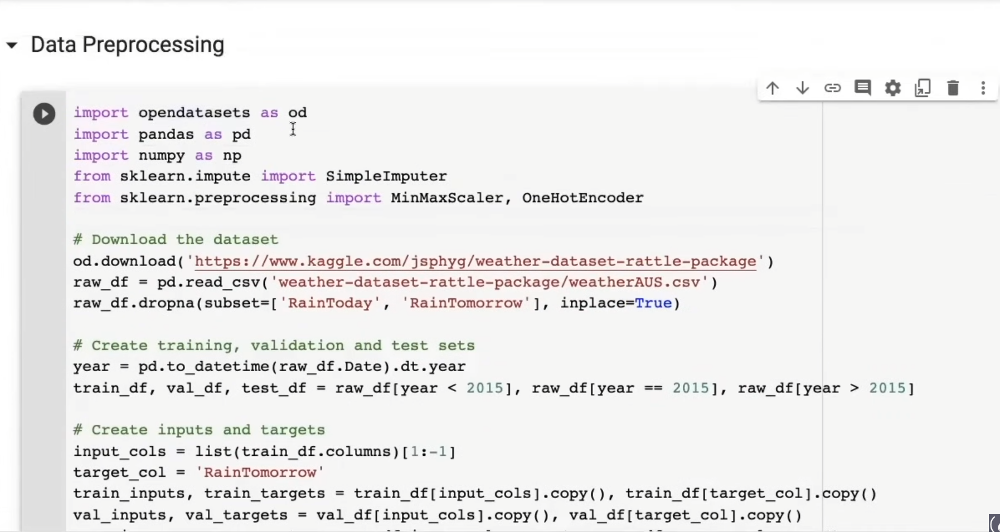

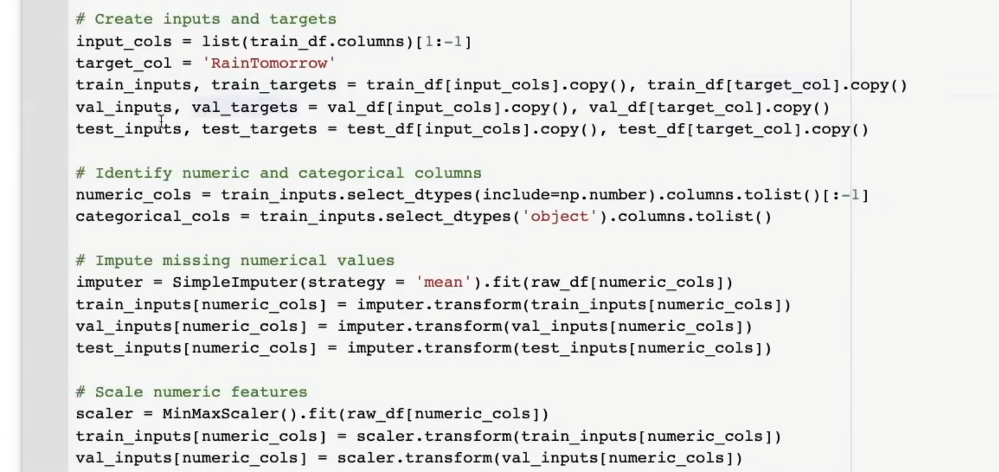

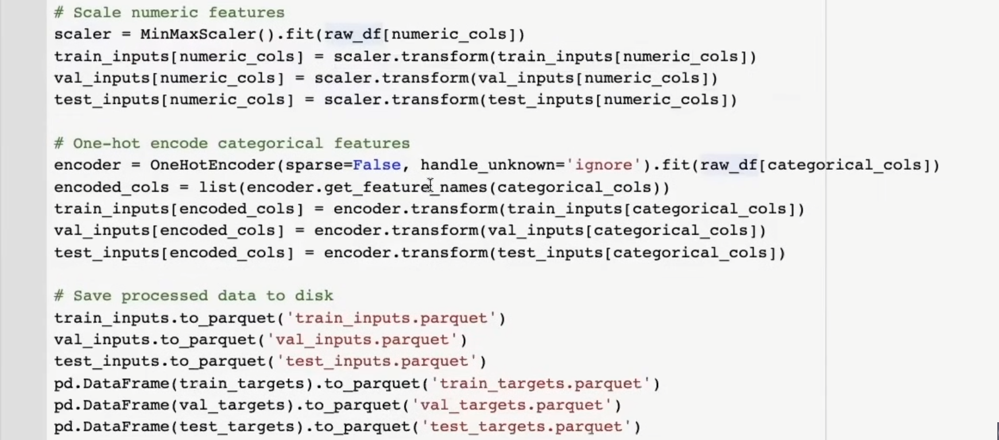

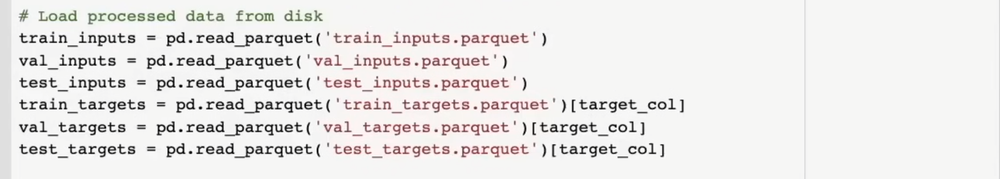

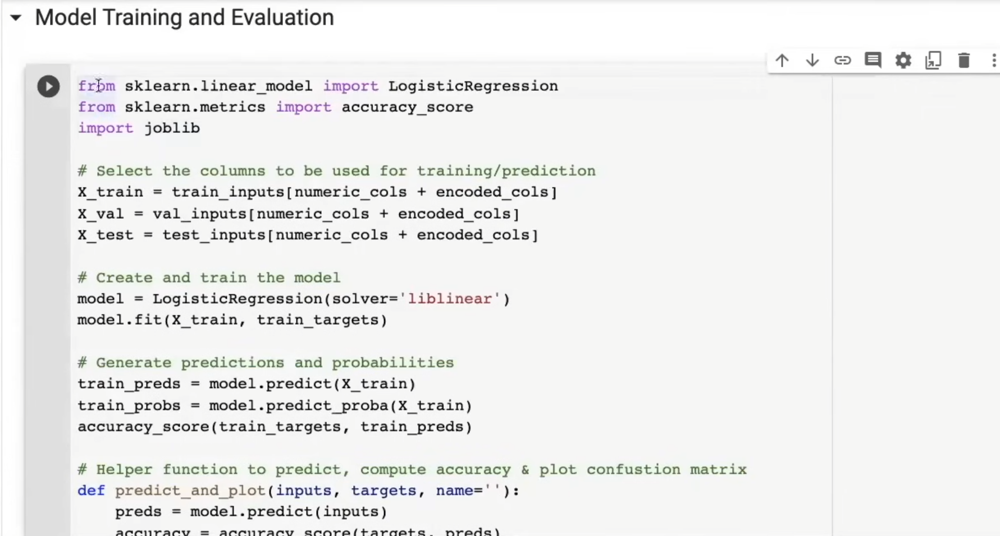

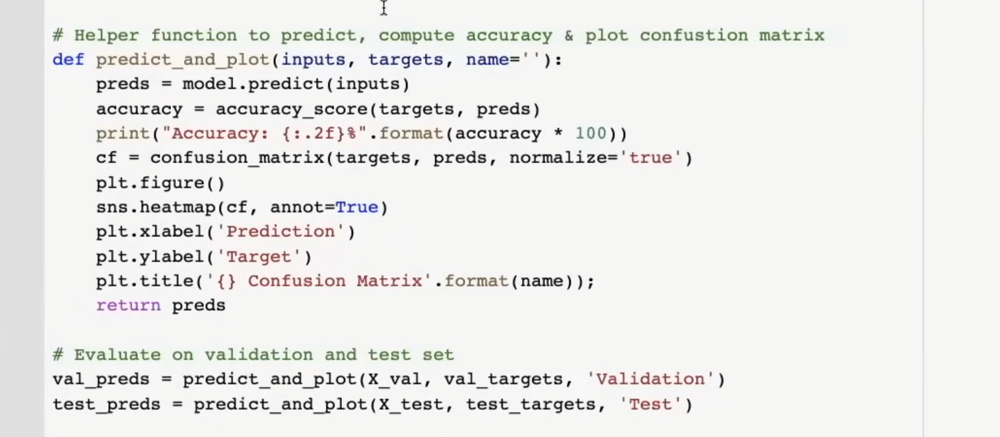

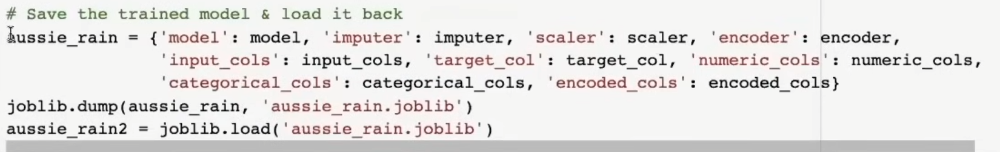

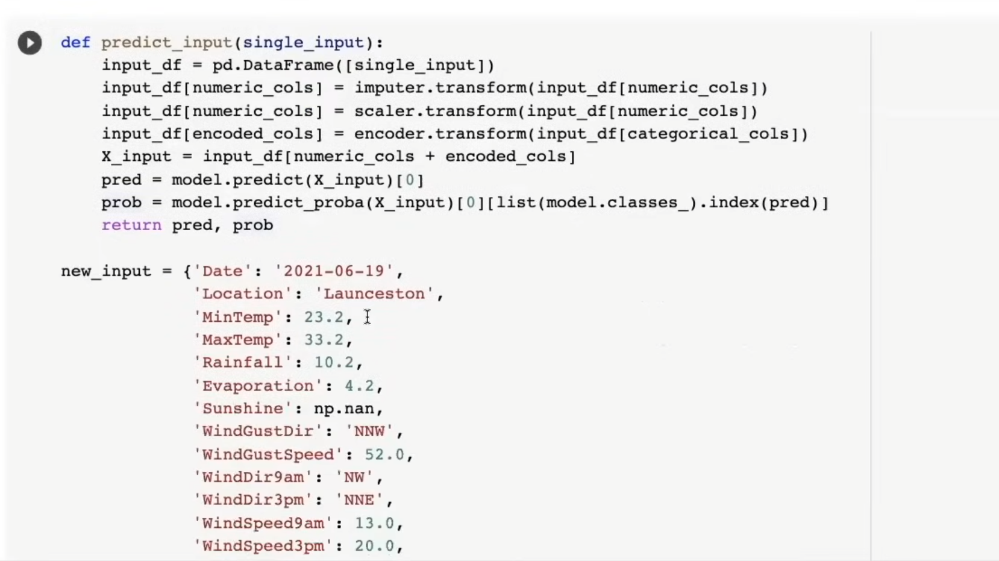

## **END**